In [1]:
# !pip install pyparsing==2.4.6
# !pip install tensorflow

In [2]:
import sys
sys.path.append("../utils/") 
from utilities import performance_metrics
import time

from src.core import Term, Atom
from src.ilp import Language_Frame, Program_Template, Rule_Template
from src.dilp import DILP
import tensorflow as tf
import numpy as np
from src.utils import process_file, process_dir, create_table, output_rules, test_rule, train, test
from src.generate_template import create_templates
import duckdb
tf.random.set_seed(1000)
np.random.seed(1000)

import dill


2024-05-23 21:20:52.152730: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-23 21:20:53.362687: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [3]:
# arity 1
term_x_0 = Term(True, 'X_0')

In [4]:
con = duckdb.connect(':memory:')
# enable automatic query parallelization
con.execute("PRAGMA threads=2")
# enable caching of parquet metadata
con.execute("PRAGMA enable_object_cache")

## Fraud

In [5]:
%%time 
input_dir = '../examples/fraud-symb-100-100'
target, p_e, constants, B, P, N = process_dir(input_dir)
language_frame = Language_Frame(target, p_e, constants)

464
end of facts processing
100
end of positive examples processing
100
end negative examples processing
data is in order
CPU times: user 186 ms, sys: 519 µs, total: 186 ms
Wall time: 186 ms


In [6]:
p_e

[type_PAYMENT(X_0),
 type_CASH_IN(X_0),
 type_DEBIT(X_0),
 type_CASH_OUT(X_0),
 deviation_from_max_7_days(X_0),
 type_TRANSFER(X_0),
 external_dest(X_0)]

In [7]:
input_table=create_table(con, input_dir, 'df')
print(f'ratio of positives %f' % (100*input_table['isFraud'].sum()/len(input_table)))
print(f'N= %f' % (len(input_table)))

ratio of positives 50.000000
N= 200.000000


### Test symbolic regression rule

      type = transfer, and
     externalDest = True, and
     amount - maxDest7 > -0.15

previous table dropped
Performance of symbolic rule performance of full train set
Accuracy: 0.999333
Precision TP/(TP+FP): 0.981258
Recall TP/(TP+FN): 0.493188
F1 Score: 0.656442
MCC Score: 0.695420
previous table dropped
Performance of symbolic rule performance of full test set
Accuracy: 0.999326
Precision TP/(TP+FP): 0.984448
Recall TP/(TP+FN): 0.501188
F1 Score: 0.664218
MCC Score: 0.702175


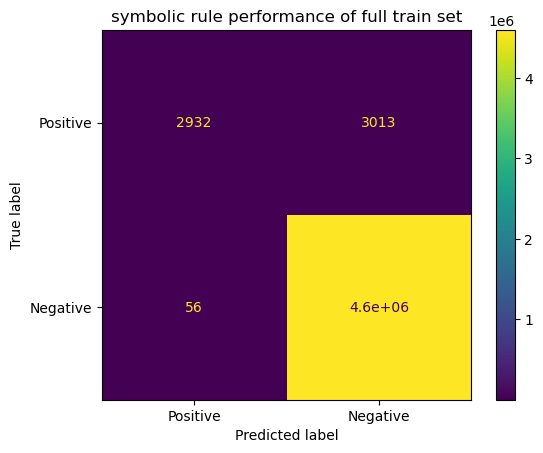

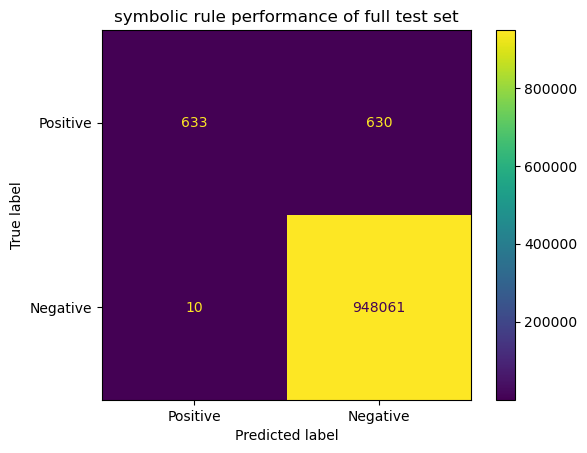

In [8]:
input_table=create_table(con, '../examples/fraud-symb-full', 'df')
predicted_table=test_rule(con, 'select "type_TRANSFER" and "external_dest" as "pred1",\n "deviation_from_max_7_days" and "pred1" as "isFraud",\n', target_predicate="isFraud")
performance_metrics(predicted_table['isFraud'], input_table['isFraud'], labels=[True,False], title='symbolic rule performance of full train set')

input_table=create_table(con, input_dir, 'df_test')
predicted_table=test_rule(con, 'select "type_TRANSFER" and "external_dest" as "pred1",\n "deviation_from_max_7_days" and "pred1" as "isFraud",\n', target_predicate="isFraud")
performance_metrics(predicted_table['isFraud'], input_table['isFraud'], labels=[True,False], title='symbolic rule performance of full test set')

previous table dropped
Performance of Symbolic Rule performance train 100/100
Accuracy: 0.715000
Precision TP/(TP+FP): 1.000000
Recall TP/(TP+FN): 0.430000
F1 Score: 0.601399
MCC Score: 0.523341


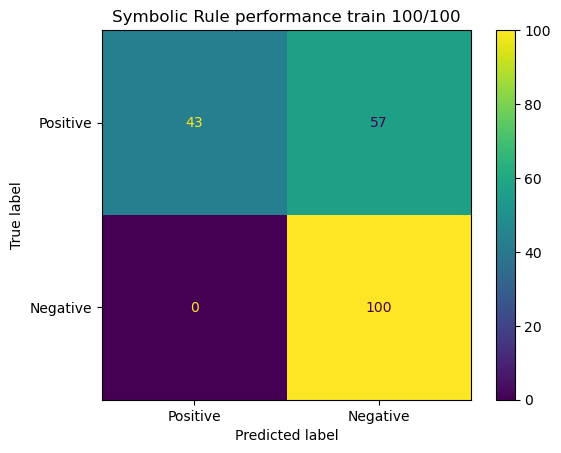

In [9]:
input_table=create_table(con, input_dir, 'df')
predicted_table=test_rule(con, 'select "type_TRANSFER" and "external_dest" as "pred1",\n "deviation_from_max_7_days" and "pred1" as "isFraud",\n', target_predicate="isFraud")
performance_metrics(predicted_table['isFraud'], input_table['isFraud'], labels=[True,False], title='Symbolic Rule performance train 100/100')

In [10]:
T=5
p_a, rules = create_templates(p_e[0:3], target, term_x_0)
program_template = Program_Template(p_a, rules, T=T)
dilp_p3_T5 = DILP(language_frame, B, P, N, program_template, allow_target_recursion=True)
train(dilp_p3_T5)

Performing Inference
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Inference Complete
Performing Inference
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Inference Complete
--------------------
step 0 loss is 0.9585254788398743
Performing Inference
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Inference Complete
isFraud(199) Expected: 1 0.435
isFraud(118) Expected: 1 0.770
isFraud(53) Expected: 0 0.559
isFraud(117) Expected: 1 0.435
isFraud(162) Expected: 1 0.435
isFraud(93) Expected: 0 0.713
isFraud(172) Expected: 1 0.060
isFraud(126) Expected: 1 0.770
isFraud(96) Expected: 0 0.569
isFraud(105) Expected: 1 0.770
isFraud(192) Expected: 1 0.008
isFraud(37) Expected: 0 0.435
isFraud(177) Expected: 1 0.435
isFraud(168) Expected: 1 0.435
isFraud(108) Expected: 1 0.435
isFraud(135) Expected: 1 0.770
isFraud(163) Expected: 1 0.435
isFraud(186) Expected: 1 0.770
isFraud(5) Expected: 0 0.713
isFra

previous table dropped
----------------------------
isFraud(X_0)
isFraud(X_0) -> pred1(X_0),pred1(X_0)
None
----------------------------
----------------------------
pred1(X_0)
pred1(X_0) -> type_TRANSFER(X_0),external_dest(X_0)
None
----------------------------
pred1 : type_TRANSFER external_dest
isFraud : pred1 pred1
select "type_TRANSFER" and "external_dest" as "pred1",
 "pred1" and "pred1" as "isFraud",

Performance of 
Accuracy: 0.999318
Precision TP/(TP+FP): 0.973846
Recall TP/(TP+FN): 0.501188
F1 Score: 0.661788
MCC Score: 0.698376


'select "type_TRANSFER" and "external_dest" as "pred1",\n "pred1" and "pred1" as "isFraud",\n'

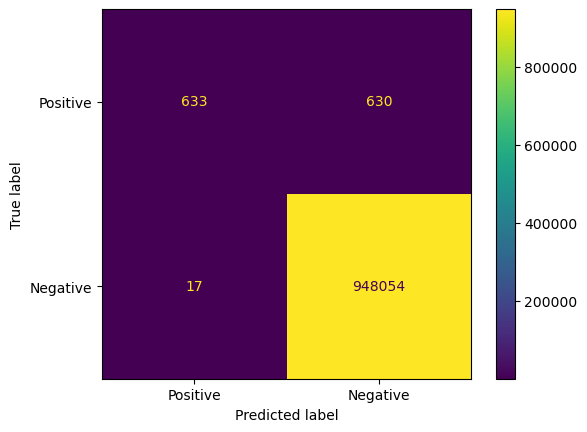

In [11]:
test(dilp_p3_T5, create_table(con, input_dir, 'df_test'), con)

previous table dropped
----------------------------
isFraud(X_0)
isFraud(X_0) -> pred1(X_0),pred1(X_0)
None
----------------------------
----------------------------
pred1(X_0)
pred1(X_0) -> type_TRANSFER(X_0),external_dest(X_0)
None
----------------------------
pred1 : type_TRANSFER external_dest
isFraud : pred1 pred1
select "type_TRANSFER" and "external_dest" as "pred1",
 "pred1" and "pred1" as "isFraud",

Performance of 
Accuracy: 0.715000
Precision TP/(TP+FP): 1.000000
Recall TP/(TP+FN): 0.430000
F1 Score: 0.601399
MCC Score: 0.523341


'select "type_TRANSFER" and "external_dest" as "pred1",\n "pred1" and "pred1" as "isFraud",\n'

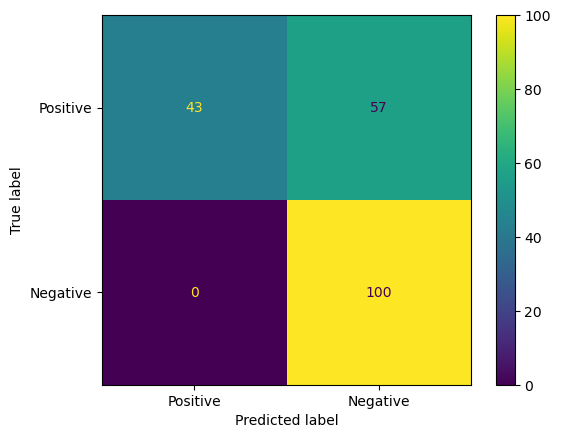

In [12]:
test(dilp_p3_T5, create_table(con, input_dir, 'df'), con)

# create all possible predicates

In [13]:
T=5
p_a, rules = create_templates(p_e[0:4], target, term_x_0)
program_template = Program_Template(p_a, rules, T=T)
dilp_p4_T5 = DILP(language_frame, B, P, N, program_template, allow_target_recursion=True)
train(dilp_p4_T5)

Performing Inference
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Inference Complete
Performing Inference
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Inference Complete
--------------------
step 0 loss is 1.1995093822479248
Performing Inference
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Inference Complete
isFraud(199) Expected: 1 0.127
isFraud(118) Expected: 1 0.166
isFraud(53) Expected: 0 0.099
isFraud(117) Expected: 1 0.127
isFraud(162) Expected: 1 0.127
isFraud(93) Expected: 0 0.164
isFraud(172) Expected: 1 0.037
isFraud(126) Expected: 1 0.166
isFraud(96) Expected: 0 0.471
isFraud(105) Expected: 1 0.166
isFraud(192) Expected: 1 0.015
isFraud(37) Expected: 0 0.127
isFraud(177) Expected: 1 0.127
isFraud(168) Expected: 1 0.127
isFraud(108) Expected: 1 0.127
isFraud(135) Expected: 1 0.166
isFraud(163) Expected: 1 0.127
isFraud(186) Expected: 1 0.166
isFraud(5) Expected: 0 0.164
isFra

previous table dropped
----------------------------
isFraud(X_0)
isFraud(X_0) -> pred2(X_0),pred2(X_0)
None
----------------------------
----------------------------
pred1(X_0)
pred1(X_0) -> pred2(X_0),external_dest(X_0)
None
----------------------------
----------------------------
pred2(X_0)
pred2(X_0) -> type_TRANSFER(X_0),external_dest(X_0)
None
----------------------------
pred2 : type_TRANSFER external_dest
pred1 : pred2 external_dest
isFraud : pred2 pred2
select "type_TRANSFER" and "external_dest" as "pred2",
 "pred2" and "external_dest" as "pred1",
 "pred2" and "pred2" as "isFraud",

Performance of 
Accuracy: 0.999318
Precision TP/(TP+FP): 0.973846
Recall TP/(TP+FN): 0.501188
F1 Score: 0.661788
MCC Score: 0.698376


'select "type_TRANSFER" and "external_dest" as "pred2",\n "pred2" and "external_dest" as "pred1",\n "pred2" and "pred2" as "isFraud",\n'

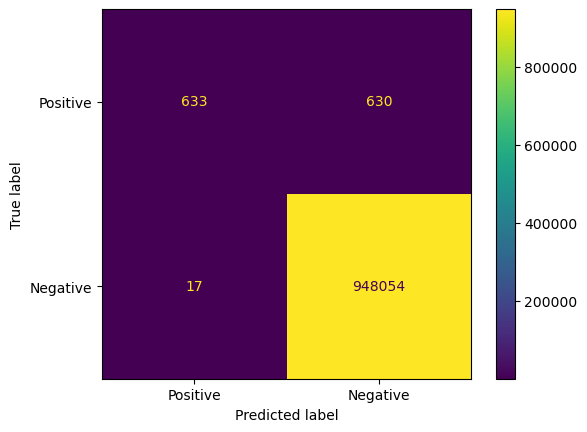

In [14]:
test(dilp_p4_T5, create_table(con, input_dir, 'df_test'), con)

previous table dropped
----------------------------
isFraud(X_0)
isFraud(X_0) -> pred2(X_0),pred2(X_0)
None
----------------------------
----------------------------
pred1(X_0)
pred1(X_0) -> pred2(X_0),external_dest(X_0)
None
----------------------------
----------------------------
pred2(X_0)
pred2(X_0) -> type_TRANSFER(X_0),external_dest(X_0)
None
----------------------------
pred2 : type_TRANSFER external_dest
pred1 : pred2 external_dest
isFraud : pred2 pred2
select "type_TRANSFER" and "external_dest" as "pred2",
 "pred2" and "external_dest" as "pred1",
 "pred2" and "pred2" as "isFraud",

Performance of 
Accuracy: 0.715000
Precision TP/(TP+FP): 1.000000
Recall TP/(TP+FN): 0.430000
F1 Score: 0.601399
MCC Score: 0.523341


'select "type_TRANSFER" and "external_dest" as "pred2",\n "pred2" and "external_dest" as "pred1",\n "pred2" and "pred2" as "isFraud",\n'

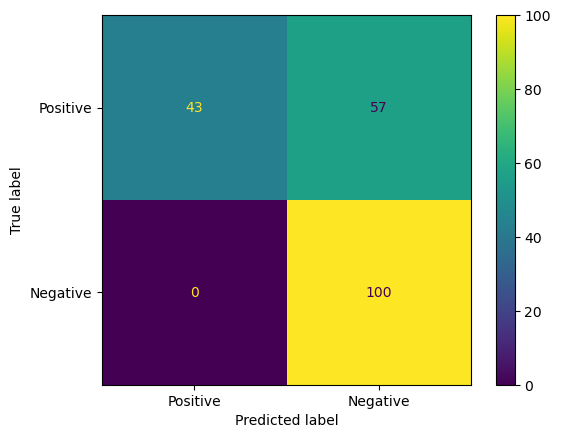

In [15]:
test(dilp_p4_T5, create_table(con, input_dir, 'df'), con)

In [16]:
dilp_p3_T5.program_template.rules

{pred1(X_0): (<src.ilp.template.rule_template.Rule_Template at 0x7ffa27bd0a10>,
  None),
 isFraud(X_0): (<src.ilp.template.rule_template.Rule_Template at 0x7ffa27bf6790>,
  None)}

In [17]:
dilp_p4_T5.program_template.rules

{pred1(X_0): (<src.ilp.template.rule_template.Rule_Template at 0x7ffa0cbdf110>,
  None),
 pred2(X_0): (<src.ilp.template.rule_template.Rule_Template at 0x7ffa05126790>,
  None),
 isFraud(X_0): (<src.ilp.template.rule_template.Rule_Template at 0x7ffa0514f950>,
  None)}

## 1% fraud data set

In [18]:
%%time 
input_dir = '../examples/fraud-symb-10-1000/'
target, p_e, constants, B, P, N = process_dir(input_dir)
language_frame = Language_Frame(target, p_e, constants)
input_table=create_table(con, input_dir, 'df')
print(f'ratio of positives %f' % (100*input_table['isFraud'].sum()/len(input_table)))
print(f'N= %f' % (len(input_table)))


2420
end of facts processing
10
end of positive examples processing
1000
end negative examples processing
data is in order
previous table dropped
ratio of positives 0.990099
N= 1010.000000
CPU times: user 2.37 s, sys: 7.99 ms, total: 2.37 s
Wall time: 2.38 s


In [19]:
T=5
p_a, rules = create_templates(p_e[0:3], target, term_x_0)
program_template = Program_Template(p_a, rules, T=T)
dilp_p3_T5_10_1000 = DILP(language_frame, B, P, N, program_template, allow_target_recursion=True)
train(dilp_p3_T5_10_1000)

Performing Inference
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Inference Complete
Performing Inference
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Inference Complete
--------------------
step 0 loss is 0.3389716148376465
Performing Inference
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Inference Complete
isFraud(548) Expected: 0 0.052
isFraud(789) Expected: 0 0.385
isFraud(537) Expected: 0 0.148
isFraud(258) Expected: 0 0.385
isFraud(667) Expected: 0 0.385
isFraud(312) Expected: 0 0.385
isFraud(327) Expected: 0 0.385
isFraud(231) Expected: 0 0.385
isFraud(523) Expected: 0 0.385
isFraud(117) Expected: 0 0.047
isFraud(645) Expected: 0 0.148
isFraud(207) Expected: 0 0.070
isFraud(563) Expected: 0 0.385
isFraud(941) Expected: 0 0.047
isFraud(858) Expected: 0 0.385
isFraud(663) Expected: 0 0.047
isFraud(943) Expected: 0 0.047
isFraud(999) Expected: 0 0.047
isFraud(841) Expected: 0 0.385

In [20]:
T=5
p_a, rules = create_templates(p_e[0:4], target, term_x_0)
program_template = Program_Template(p_a, rules, T=T)
dilp_p4_T5_10_1000 = DILP(language_frame, B, P, N, program_template, allow_target_recursion=True)
train(dilp_p4_T5_10_1000)

Performing Inference
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Inference Complete
Performing Inference
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Inference Complete
--------------------
step 0 loss is 0.16989590227603912
Performing Inference
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Inference Complete
isFraud(548) Expected: 0 0.290
isFraud(789) Expected: 0 0.191
isFraud(537) Expected: 0 0.044
isFraud(258) Expected: 0 0.191
isFraud(667) Expected: 0 0.191
isFraud(312) Expected: 0 0.191
isFraud(327) Expected: 0 0.191
isFraud(231) Expected: 0 0.191
isFraud(523) Expected: 0 0.191
isFraud(117) Expected: 0 0.007
isFraud(645) Expected: 0 0.044
isFraud(207) Expected: 0 0.027
isFraud(563) Expected: 0 0.191
isFraud(941) Expected: 0 0.007
isFraud(858) Expected: 0 0.191
isFraud(663) Expected: 0 0.007
isFraud(943) Expected: 0 0.007
isFraud(999) Expected: 0 0.007
isFraud(841) Expected: 0 0.19

previous table dropped
----------------------------
isFraud(X_0)
isFraud(X_0) -> type_TRANSFER(X_0),pred1(X_0)
None
----------------------------
----------------------------
pred1(X_0)
pred1(X_0) -> pred2(X_0),external_dest(X_0)
None
----------------------------
----------------------------
pred2(X_0)
pred2(X_0) -> type_TRANSFER(X_0),type_TRANSFER(X_0)
None
----------------------------
pred2 : type_TRANSFER type_TRANSFER
pred1 : pred2 external_dest
isFraud : type_TRANSFER pred1
select "type_TRANSFER" and "type_TRANSFER" as "pred2",
 "pred2" and "external_dest" as "pred1",
 "type_TRANSFER" and "pred1" as "isFraud",

Performance of 
Accuracy: 0.996040
Precision TP/(TP+FP): 1.000000
Recall TP/(TP+FN): 0.600000
F1 Score: 0.750000
MCC Score: 0.773052


'select "type_TRANSFER" and "type_TRANSFER" as "pred2",\n "pred2" and "external_dest" as "pred1",\n "type_TRANSFER" and "pred1" as "isFraud",\n'

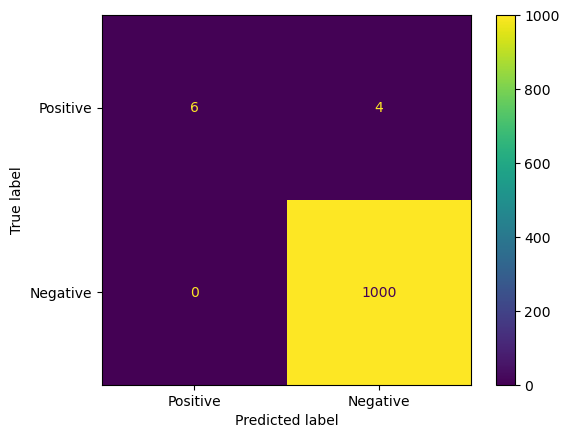

In [21]:
test(dilp_p4_T5_10_1000, create_table(con, input_dir, 'df'), con)

previous table dropped
----------------------------
isFraud(X_0)
isFraud(X_0) -> type_TRANSFER(X_0),pred1(X_0)
None
----------------------------
----------------------------
pred1(X_0)
pred1(X_0) -> pred2(X_0),external_dest(X_0)
None
----------------------------
----------------------------
pred2(X_0)
pred2(X_0) -> type_TRANSFER(X_0),type_TRANSFER(X_0)
None
----------------------------
pred2 : type_TRANSFER type_TRANSFER
pred1 : pred2 external_dest
isFraud : type_TRANSFER pred1
select "type_TRANSFER" and "type_TRANSFER" as "pred2",
 "pred2" and "external_dest" as "pred1",
 "type_TRANSFER" and "pred1" as "isFraud",

Performance of 
Accuracy: 0.999318
Precision TP/(TP+FP): 0.973846
Recall TP/(TP+FN): 0.501188
F1 Score: 0.661788
MCC Score: 0.698376


'select "type_TRANSFER" and "type_TRANSFER" as "pred2",\n "pred2" and "external_dest" as "pred1",\n "type_TRANSFER" and "pred1" as "isFraud",\n'

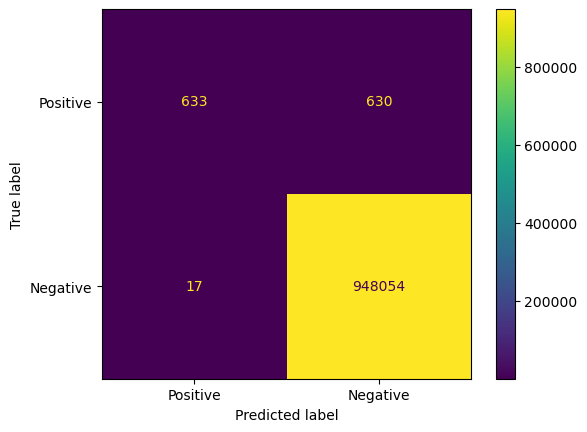

In [22]:
test(dilp_p4_T5_10_1000, create_table(con, input_dir, 'df_test'), con)